# PRACTICUM 1

In [34]:

from fractions import Fraction
from sympy import *
import numpy as np
from scipy.integrate import odeint

import plotly as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
py.offline.init_notebook_mode(connected=True)


In [35]:

x, y, z, dy, dx, C, expo = symbols('x y z dy dx C e')

## OPDRACHT 1

De eerst orde differentiaalvergelijking is:

$$
\dfrac{dy}{dx} + 3y = 4x
$$

De beginvoorwaarde is:

$$
y(0) = 3
$$

<span style="color:red">**Vul in: de functie voor de eerste orde differentiaalvergelijking.**</span>

In [36]:
def dy_dx(y,x):
        return 4*x - 3 *y

<span style="color:red">**Vul in: de beginvoorwaarde.**</span>

In [37]:
y0 = 3

<hr style="border:2px solid blue">

## Analytische Oplossing

De algemene oplossing is:

$$
y = Ce^{A1 \cdot x}+A\cdot x + B
$$


<span style="color:red">**Bereken analytisch de algemene oplossing.**</span>


<span style="color:red">**Vul in: de waardes voor l, A, B en C.**</span>

In [38]:
l = -3
A = 4/3
B = -4/9

In [39]:
C = 31/9

In [40]:

display(Eq(y,simplify(C*expo**(l*x))+nsimplify(A)*x+nsimplify(B)))

Eq(y, 4*x/3 - 4/9 + 3.44444444444444/e**(3*x))

<span style="color:red">**Vul in: de algemene oplossing.**</span>

In [41]:
def analytische_oplossing(x):
    return C*np.e**(l*x)+A*x+B

In [42]:

def odeint_oplossing(ode_func, y0, t):
    y = odeint(ode_func, y0, t)
    return y

In [43]:

x_current = np.linspace(0,10,100)
y_odeint = odeint_oplossing(dy_dx, y0, x_current)

#x_current = np.linspace(0,100,1000)
y_an = analytische_oplossing(x_current)

y_an2=y_an.reshape(-1)
y_odeint2=y_odeint.reshape(-1)

In [44]:

# Generate a grid of x,y values
x = np.linspace(-6, 6, 73)
y = np.linspace(-6, 6, 73)

X, Y = np.meshgrid(x, y)
U = 1  # Constant unit vector for slope field
V = dy_dx(Y, X)

# Normalize the arrow length
N = np.sqrt(U**2 + V**2)
U = U / N
V = V / N

fig = ff.create_quiver(X, Y, U, V, scale=0.15, arrow_scale=.2)

fig.add_trace(go.Scatter(
                    x=x_current,
                    y=y_an2,
                    mode='lines',
                    )
)

#fig.add_trace(go.Scatter(
#                    x=x_current,
#                    y=y_odeint2,
#                    mode='lines',
#                    )
#)

fig.update_layout(height=600,
                  width=1000,
                  yaxis_range=[-3,3],
                  yaxis_title='y-as',
                  xaxis_range=[-3,3],
                  xaxis_title='x-as',
                  title = 'Richtingsveld'
)

py.offline.iplot(fig)

<span style="color:red">**Vul in: Beschrijf hoe je aan het richtingsveld kunt zien of de door jou gekozen analytische oplossing goed is .**</span>

[lege ruimte voor antwoord]








<hr style="border:2px solid blue">

## Euler voorwaarts Methode

De functie $y(x)$ kan formeel gezien als volgt bepaald worden:

$$
y(x) = y(x_0) + \int y'(t)dt = y(x_0) + \int f(t, y(t))dt
$$


Deze integraal is over het algemeen niet analytisch te bepalen. Een methode om deze integraal te benaderen is om de waarde van de integraal te benaderen met de waarde van $f(t,y(t))$ aan het begin van het interval keer de breedte van het interval. Dit geeft de volgende benadering:

$$
y(x) = y(x_0) + (x-x_0)f(x_0 y(x_0))
$$

Logisch is dat deze benadering voor $x$ ver van $x_0$ niet betrouwbaar zal zijn. Daarom wordt gekozen om voor de benadering op een interval dit interval in kleine stappen met grootte $h$ te verdelen en vervolgens deze formule achtereenvolgens op de verschillende punten toe te passen. De benadering in punt $i$ wordt vaak genoteerd als $w_i$. De recursieve formule voor Euler voorwaarts is:

$$
w_{n+1} = w_n + h \cdot f(x_n, w_n)
$$


<span style="color:red">**Vul in: de euler voorwaarts methode.**</span>

In [45]:
def euler_voorwaarts_methode(dy_dx, y0, x):
    
    # Maak een lege lijst aan voor het resultaat
    y = np.zeros_like(x)
    
    y[0]= 3
    
    for i in range(1,len(x)):
        h = x[i]-x[i-1]
        y[i] = y[i-1]+ h * dy_dx(y[i-1],x[i-1]) 
        
    return y

<span style="color:red">**Bereken handmatig W1 t/m W4 voor een stapgrootte van 0.1.**</span>

W1 = @@@ \
W2 = @@@ \
W3 = @@@ \
W4 = @@@ 

<span style="color:red">**Vul in: de gewenste stapgrootte.**</span>

In [46]:
# minimaal 2 waardes invullen, dit mogen dezelfde zijn.
euler_voorwaarts_stapgrootte1 = 1
euler_voorwaarts_stapgrootte2 = 0.5

In [47]:

# Creëer data
x_euler_voorwaarts1 = np.arange(0, 10+euler_voorwaarts_stapgrootte1,euler_voorwaarts_stapgrootte1)
y_euler_voorwaarts1 = euler_voorwaarts_methode(dy_dx, y0, x_euler_voorwaarts1) 

x_euler_voorwaarts2 = np.arange(0, 10+euler_voorwaarts_stapgrootte2,euler_voorwaarts_stapgrootte2)
y_euler_voorwaarts2 = euler_voorwaarts_methode(dy_dx, y0, x_euler_voorwaarts2) 

In [48]:

# Plot het resultaat
fig = ff.create_quiver(X, Y, U, V, scale=0.15, arrow_scale=.2)

fig.add_trace(go.Scatter(
                    x=x_current,
                    y=y_an2,
                    mode='lines',
                    name = 'analytische oplossing'
                    )
)

#fig.add_trace(go.Scatter(
#                    x=x_current,
#                    y=y_odeint2,
#                    mode='lines',
#                    )
#)

fig.add_trace(go.Scatter(
    x = x_euler_voorwaarts1,
    y = y_euler_voorwaarts1,
    mode = 'markers+lines',
    name = 'euler '+str(euler_voorwaarts_stapgrootte1),
    line_color= 'green',
))

fig.add_trace(go.Scatter(
    x = x_euler_voorwaarts2,
    y = y_euler_voorwaarts2,
    mode = 'markers+lines',
    name = 'euler '+str(euler_voorwaarts_stapgrootte2),
    line_color= 'blue',
))

fig.update_layout(height=600,
                  width=1000,
                  yaxis_range=[-1,5],
                  yaxis_title='y-as',
                  xaxis_range=[0,6],
                  xaxis_title='x-as',
                  title = 'Richtingsveld'
)

#py.offline.iplot(fig)
(fig)

### Mean Square Error (MSE)

De formule voor de Mean Square Error is:
$$
MSE = \dfrac{1}{n}\sum_{i=0}^{n} (y_i - w_i)^2
$$

In [49]:
# Bereken de Mean Squared Error (MSE) voor Modified Euler Methode
y_values1 = analytische_oplossing(x_euler_voorwaarts1)
y_values2 = analytische_oplossing(x_euler_voorwaarts2)
mse_euler1 = np.mean((y_values1 - y_euler_voorwaarts1 )**2)
mse_euler2 = np.mean((y_values2 - y_euler_voorwaarts2 )**2)
#print(len(y_values2))
#print(len(y_euler_voorwaarts2))
print(mse_euler1)
print(mse_euler2)

1507939.7041959113
0.33132983949602185


<span style="color:red">**Vul in: Geef een uitleg over de uiteindelijke gekozen stapgrootte. Gebruik daarbij de gevonden waardes voor de MSE.**</span>

[lege ruimte voor antwoord]








<hr style="border:2px solid blue">

## Modified Euler Methode

De functie $y(x)$ kan formeel gezien als volgt bepaald worden:

$$
y(x) = y(x_0) + \int y'(t)dt = y(x_0) + \int f(t, y(t))dt
$$

Bij Euler voorwaarts wordt de integraal benaderd met behulp van de waarde van $f(x,y)$ in het punt $(x_n,w_n)$. De benadering van de integraal zou nauwkeuriger zijn als de waarde van $f(x_{n+1}, w_{n+1})$ ook gebruikt zou worden, bijvoorbeeld door de trapeziumregel toe te passen:

$$
w_{n+1} = w_n + \dfrac{h}{2} \left( f(x_n, w_n) + f(x_{n+1}, w_{n+1}) \right)
$$

Dit is een impliciete formule die niet direct is toe te passen. Modified Euler is gebaseerd op deze regel, maar dan expliciet gemaakt. De onbekende waarde wn+1 aan de rechterzijde van de vergelijking wordt eerst geschat, dit wordt de predictor genoemd. Dit geeft de volgende recursieve formules:

$$
\bar{w}_{n+1} = w_n + h \cdot f(x_n, w_n)
$$

$$
w_{n+1} = w_n + \dfrac{h}{2} \left( f(x_n, w_n) + f(x_{n+1}, \bar{w}_{n+1}) \right)
$$



<span style="color:red">**Vul in: de modified euler methode.**</span>

In [50]:
def modified_euler_methode(dy_dx, y0, x):
    y = np.zeros_like(x)
    y[0] = 3

    for i in range(1, len(x)):
        h = x[i]-x[i-1]

        # Predict using Euler's method
        y_predictor = y[i-1]+ h * dy_dx(y[i-1],x[i-1]) 

        # Correct using the average slope
        y[i] = y[i-1] + (h/2) * (dy_dx(y[i-1],x[i-1]) + dy_dx(y_predictor, x[i]))

    return y

<span style="color:red">**Vul in: de gewenste stapgrootte.**</span>

In [51]:
# minimaal 2 waardes invullen, dit mogen dezelfde zijn.
euler_modified_stapgrootte1 = 1
euler_modified_stapgrootte2 = 0.5

In [52]:

x_modified_euler1 = np.arange(0, 10+euler_modified_stapgrootte1,euler_modified_stapgrootte1)
y_modified_euler1 = modified_euler_methode(dy_dx, y0, x_modified_euler1)

x_modified_euler2 = np.arange(0, 10+euler_modified_stapgrootte2,euler_modified_stapgrootte2)
y_modified_euler2 = modified_euler_methode(dy_dx, y0, x_modified_euler2) 

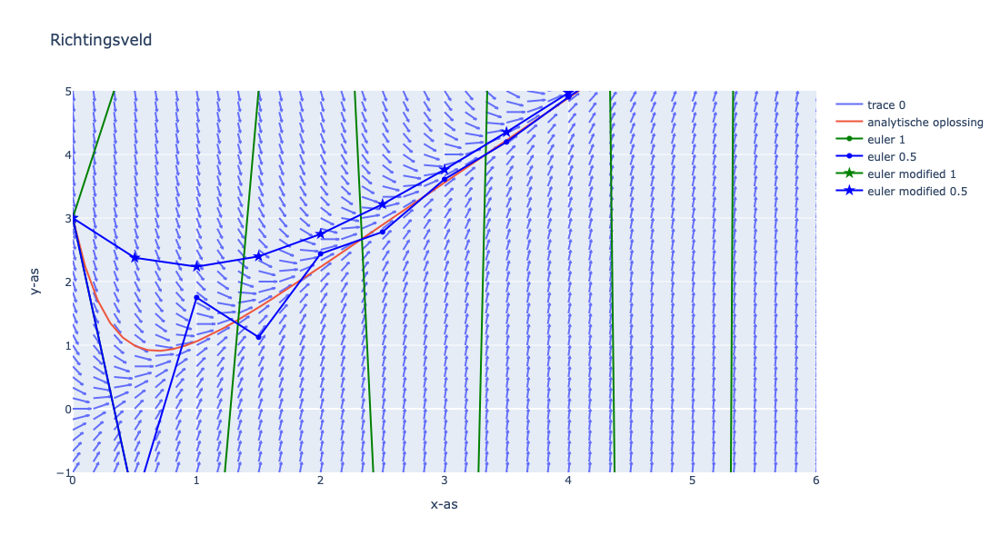

In [53]:

fig = ff.create_quiver(X, Y, U, V, scale=0.15, arrow_scale=.2)

fig.add_trace(go.Scatter(
                    x=x_current,
                    y=y_an2,
                    mode='lines',
                    name = 'analytische oplossing'
                    )
)

#fig.add_trace(go.Scatter(
#                    x=x_current,
#                    y=y_odeint2,
#                    mode='lines',
#                    )
#)

fig.add_trace(go.Scatter(
    x = x_euler_voorwaarts1,
    y = y_euler_voorwaarts1,
    mode = 'markers+lines',
    name = 'euler '+str(euler_voorwaarts_stapgrootte1),
    line_color= 'green',
))

fig.add_trace(go.Scatter(
    x = x_euler_voorwaarts2,
    y = y_euler_voorwaarts2,
    mode = 'markers+lines',
    name = 'euler '+str(euler_voorwaarts_stapgrootte2),
    line_color= 'blue',
))

fig.add_trace(go.Scatter(
    x = x_modified_euler1,
    y = y_modified_euler1,
    marker = dict(
            size=10,
            symbol ="star",
            color='green',
            ),
    mode = 'markers+lines',
    name = 'euler modified '+str(euler_modified_stapgrootte1),
    line_color= 'green',
))

fig.add_trace(go.Scatter(
    x = x_modified_euler2,
    y = y_modified_euler2,
    marker = dict(
            size=10,
            symbol ="star",
            color='blue',
            ),
    mode = 'markers+lines',
    name = 'euler modified '+str(euler_modified_stapgrootte2),
    line_color= 'blue',
))
    
fig.update_layout(height=600,
                  width=1000,
                  yaxis_range=[-1,5],
                  yaxis_title='y-as',
                  xaxis_range=[0,6],
                  xaxis_title='x-as',
                  title = 'Richtingsveld'
)

#py.offline.iplot(fig)
(fig)

### Mean Square Error (MSE)

De formule voor de Mean Square Error is:
$$
MSE = \dfrac{1}{n}\sum_{i=0}^{n} (y_i - w_i)^2
$$

In [54]:
# Bereken de Mean Squared Error (MSE) voor Modified Euler Methode
y_values1 = analytische_oplossing(x_modified_euler1)
y_values2 = analytische_oplossing(x_modified_euler2)
mse_euler1 = np.mean((y_values1 - y_modified_euler1 )**2)
mse_euler2 = np.mean((y_values2 - y_modified_euler2 )**2)
#print(len(y_values1))
#print(len(y_modified_euler1))
print(mse_euler1)
print(mse_euler2)

97715812.40270399
0.20864554484512038


<span style="color:red">**Vul in: Geef een uitleg over de uiteindelijke gekozen stapgrootte. Gebruik daarbij de gevonden waardes voor de MSE.**</span>

[lege ruimte voor antwoord]






